In [1]:
## Explainability
#!pip install -r requirements.txt --user
#!pip install numpy
import pandas as pd
import matplotlib


In [2]:
#Loading COO Matrices - sparse with OHE of all original Features

def load_models():
    from sklearn.externals import joblib
    from keras.models import load_model
    sklearn_nn_file = 'models/UCI_Census/SklearnNeuralNet.pkl'
    keras_ann_file = 'models/UCI_Census/ann_deepexplain.h5'
    rf_file = "models/UCI_Census/random_forest.pkl"
    gbc_file = "models/UCI_Census/GBC.pkl"
    logit_file = "models/UCI_Census/Logit.pkl"

    rfc = joblib.load(rf_file)
    gbc = joblib.load(gbc_file)
    logit = joblib.load(logit_file)
    keras_ann = load_model(keras_ann_file)
    sk_ann = joblib.load(sklearn_nn_file)
    return rfc, gbc, logit, keras_ann, sk_ann


def save_obj(obj, name):
    import pickle
    with open('obj/census/' + name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)


def load_obj(name):
    import pickle
    with open('obj/census/' + name + '.pkl', 'rb') as f:
        return pickle.load(f)

Load Data Objects. Stored these locally/remotely to avoid dependency issues

In [3]:
feature_names = [
    "Age", "Workclass", "fnlwgt", "Education", "Education-Num",
    "Marital Status", "Occupation", "Relationship", "Race", "Sex",
    "Capital Gain", "Capital Loss", "Hours per week", "Country"
]

categorical_features = [1, 3, 5, 6, 7, 8, 9,
                        13]  #Get Nominal / Ordinal / etc..

X_train = load_obj('data_objects/X_train')
X_test = load_obj('data_objects/X_test')
y_train = load_obj('data_objects/y_train')
y_test = load_obj('data_objects/y_test')

encoded_train = load_obj('data_objects/encoded_train')
encoded_test = load_obj('data_objects/encoded_test')
categorical_names = load_obj('data_objects/categorical_names')
data = load_obj('data_objects/data')
encoder = load_obj('data_objects/encoder')

C:\Users\jdine\AppData\Roaming\Python\Python37\site-packages\sklearn\base.py:306: UserWarning: Trying to unpickle estimator OneHotEncoder from version 0.20.3 when using version 0.21.1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


Some statistics on our models

In [4]:
rfc, gbc, logit, keras_ann, sk_ann = load_models()

#Some classification Reports and Confusion Matrices
import sklearn
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

class_names = ['<50k', '>50k']

get_best_score = lambda x,y: sklearn.metrics.accuracy_score(x, y.predict(encoded_test))

rf_best_score = get_best_score(y_test, rfc)
gbc_best_score = get_best_score(y_test, gbc)
lr_best_score = get_best_score(y_test, logit)
nn_best_score = get_best_score(y_test, sk_ann)
ker_nn_best_score = sklearn.metrics.accuracy_score(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))

C:\Users\jdine\AppData\Roaming\Python\Python37\site-packages\sklearn\externals\joblib\__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)
Using TensorFlow backend.


Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


In [5]:
print("\033[1mPrinting Test Accuracy.... \033[0m")
print("Random Forest: {0:.2f} %".format(rf_best_score * 100))
print("Gradient Boosting: {0:.2f} %".format(gbc_best_score * 100))
print("Logistic Regression: {0:.2f} %".format(lr_best_score * 100))
print("SKLEARN Neural Net: {0:.2f} %".format(nn_best_score * 100))
print("Keras Neural Net: {0:.2f} % \n \n".format(ker_nn_best_score * 100))

Printing Test Accuracy.... 
Random Forest: 97.55 %
Gradient Boosting: 88.58 %
Logistic Regression: 82.45 %
SKLEARN Neural Net: 68.87 %
Keras Neural Net: 80.10 % 
 



In [6]:
from pylab import rcParams
from helpful_util import plot_confusion_matrix
import matplotlib.pyplot as plt
rcParams['figure.figsize'] = 3, 3  #Adjust plot size

print_class_report = lambda x,y: print(classification_report(x, y))


print("\033[1m Random Forest Classification Report...\n \033[0m")
print_class_report(y_test, rfc.predict(encoded_test))
cm = confusion_matrix(y_test, rfc.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m Gradient Boosting Classification Report...\n \033[0m")
print_class_report(y_test, gbc.predict(encoded_test))
cm = confusion_matrix(y_test, gbc.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m Logistic Regression Classification Report...\n \033[0m")
print_class_report(y_test, logit.predict(encoded_test))
cm = confusion_matrix(y_test, logit.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m SKLEARN Neural Network Classification Report...\n \033[0m")
print_class_report(y_test, sk_ann.predict(encoded_test))
cm = confusion_matrix(y_test, sk_ann.predict(encoded_test))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

print("\033[1m KERAS Neural Network Classification Report...\n \033[0m")
print_class_report(y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))
cm = confusion_matrix(
    y_test, np.argmax(keras_ann.predict(encoded_test.toarray()), axis=1))
plot_confusion_matrix(cm, classes=class_names, normalize=True)
plt.show()

 Random Forest Classification Report...
 
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1484
           1       0.96      0.99      0.98      1581

    accuracy                           0.98      3065
   macro avg       0.98      0.97      0.98      3065
weighted avg       0.98      0.98      0.98      3065



<Figure size 300x300 with 2 Axes>

 Gradient Boosting Classification Report...
 
              precision    recall  f1-score   support

           0       0.91      0.85      0.88      1484
           1       0.87      0.92      0.89      1581

    accuracy                           0.89      3065
   macro avg       0.89      0.88      0.89      3065
weighted avg       0.89      0.89      0.89      3065



<Figure size 300x300 with 2 Axes>

 Logistic Regression Classification Report...
 
              precision    recall  f1-score   support

           0       0.84      0.79      0.81      1484
           1       0.81      0.86      0.83      1581

    accuracy                           0.82      3065
   macro avg       0.83      0.82      0.82      3065
weighted avg       0.83      0.82      0.82      3065



<Figure size 300x300 with 2 Axes>

 SKLEARN Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.62      0.94      0.75      1484
           1       0.90      0.45      0.60      1581

    accuracy                           0.69      3065
   macro avg       0.76      0.70      0.67      3065
weighted avg       0.76      0.69      0.67      3065



<Figure size 300x300 with 2 Axes>

 KERAS Neural Network Classification Report...
 
              precision    recall  f1-score   support

           0       0.79      0.80      0.80      1484
           1       0.81      0.80      0.81      1581

    accuracy                           0.80      3065
   macro avg       0.80      0.80      0.80      3065
weighted avg       0.80      0.80      0.80      3065



<Figure size 300x300 with 2 Axes>

Graphs Showing Standard Feature Importance via Sklearn API


In [7]:
#SciKit Learn Feature Importance in Linear Coefficient Rankinks

rcParams['figure.figsize'] = 5, 5  #Adjust plot size
import seaborn as sns

#all features as a list. Unwrapping encoding
features = []
for k in categorical_names.values():
    for i in k:
        features.append(i)

continuous = [
    'age', 'fnlwgt', 'Education-Num', 'capital_gain', 'capital_loss',
    'hrs_per_week'
]

features = features + continuous 

In [8]:
def display_sklearn_feature_importance(data, n_features):
    '''
    Parameters:
    data: data object; coomatrix w/ encoded features
    n_features: number of features to visualize
    
    Returns:
    Graph of basic feature importance measurements
    
    '''
    feature_importance = pd.DataFrame({
        "feature":
        features,
        "RF_Feature_Importance":
        np.round(rfc.feature_importances_, 4),
        "GBC_Feature_Importance":
        np.round(gbc.feature_importances_, 4),
        "Logit_Coeff":
        np.round(logit.coef_[0], 4),
        "Max_Feature_Val":
        pd.DataFrame(data.toarray(), columns=features).max(),
    })

    n = n_features
    feature_importance['coeff_max'] = feature_importance[
        'Logit_Coeff'] * feature_importance['Max_Feature_Val']
    temp = feature_importance.nlargest(n, 'RF_Feature_Importance')
    sns.barplot(temp['RF_Feature_Importance'], temp['feature'])
    plt.title('Random Forest - Feature Importance Top {}'.format(n_features))
    plt.show()

    temp = feature_importance.nlargest(n, 'GBC_Feature_Importance')
    sns.barplot(temp['GBC_Feature_Importance'], temp['feature'])
    plt.title('Gradient Boosted Classifier - Feature Importance Top {}'.format(
        n_features))
    plt.show()

    #We want to show the total possible feature impact here. Take the max of each feature in the training set by the logit coeff.
    lookup = pd.DataFrame(data.toarray(), columns=features).max()
    temp = feature_importance.nlargest(int(n / 2), 'coeff_max')
    temp1 = feature_importance.nsmallest(int(n / 2), 'coeff_max')
    temp = pd.concat([temp, temp1])
    sns.barplot(temp['coeff_max'], temp['feature'])
    plt.title('Logistic Regression - Coefficients Top&Bottom {}'.format(
        int(n_features / 2)))
    plt.show()

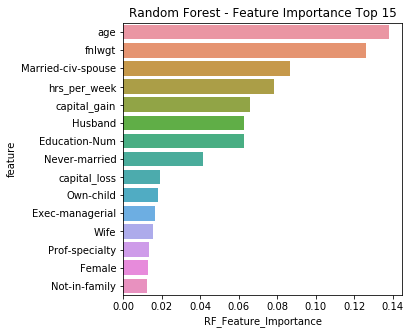

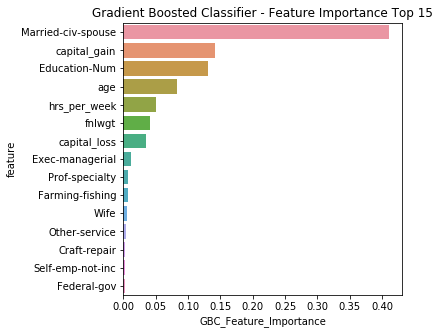

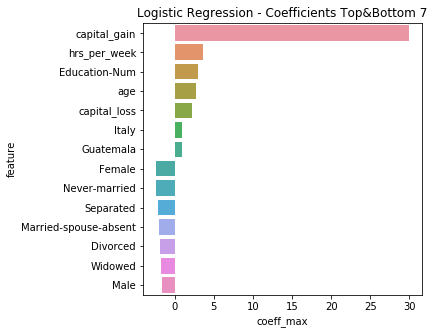

In [9]:
display_sklearn_feature_importance(data = encoded_train , n_features=15)

In [10]:
logistic_regress_coeff = pd.DataFrame({"features" : features, "Coef" : logit.coef_[0]})
logistic_regress_coeff
logistic_regress_coeff.to_csv('obj/census/logit_coefficients.csv')

Exploring with Manual Feature Perturbation

In [11]:
#Split 
#Manual perturbations
%matplotlib inline
sns.set_style('whitegrid')
X_test_holdout = load_obj('data_objects/X_test')
idx = np.random.choice(X_test_holdout.shape[0], 2000, replace=False) #Random 2000 samples w/o replacements
X_test_holdout =X_test_holdout[idx] #extract
X_test_holdout = pd.DataFrame(encoder.transform(X_test_holdout).toarray(), columns = features) #Convert to DF for column names
y_test_holdout = y_test[idx]

In [12]:
import collections

def manual_perturb(column, scalar):
    '''
    Parameters
        column: str; feature of interest
        scalar: float; multiplier
    
    
    '''
    temp = X_test_holdout.copy()
    temp[column] = temp[column] * scalar
    print("Perturbing Feature: {} by {}".format(column,scalar))
    print("Random Forest")
    print("Before Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, rfc.predict(X_test_holdout))))
    print("After Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, rfc.predict(temp))))
    print("Number of '1' Predictions, Before Perturbation: {}".format(collections.Counter(rfc.predict(X_test_holdout))[1]))
    print("Number of '1' Predictions, After Perturbation: {}".format(collections.Counter(rfc.predict(temp))[1]))


    print("\nGradient Boosted Classifier")
    print("Before Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, gbc.predict(X_test_holdout))))
    print("After Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, gbc.predict(temp))))
    print("Number of '1' Predictions, Before Perturbation: {}".format(collections.Counter(gbc.predict(X_test_holdout))[1]))
    print("Number of '1' Predictions, After Perturbation: {}".format(collections.Counter(gbc.predict(temp))[1]))

    print("\nLogistic Regression")
    print("Before Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, logit.predict(X_test_holdout))))
    print("After Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, logit.predict(temp))))
    print("Number of '1' Predictions, Before Perturbation: {}".format(collections.Counter(logit.predict(X_test_holdout))[1]))
    print("Number of '1' Predictions, After Perturbation: {}".format(collections.Counter(logit.predict(temp))[1]))
    
    print("\nNeural Net")
    print("Before Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, keras_ann.predict_classes(X_test_holdout))))
    print("After Perturbation, Accuracy: {}".format(sklearn.metrics.accuracy_score(y_test_holdout, keras_ann.predict_classes(temp))))
    print("Number of '1' Predictions, Before Perturbation: {}".format(collections.Counter(keras_ann.predict_classes(X_test_holdout))[1]))
    print("Number of '1' Predictions, After Perturbation: {}\n".format(collections.Counter(keras_ann.predict_classes(temp))[1]))   
    

manual_perturb(column = 'age', scalar = 1.1)
manual_perturb(column = 'age', scalar = 1.2)


manual_perturb(column = 'fnlwgt', scalar = 1.1)
manual_perturb(column = 'fnlwgt', scalar = 1.2)

Perturbing Feature: age by 1.1
Random Forest
Before Perturbation, Accuracy: 0.9765
After Perturbation, Accuracy: 0.9515
Number of '1' Predictions, Before Perturbation: 1069
Number of '1' Predictions, After Perturbation: 1081

Gradient Boosted Classifier
Before Perturbation, Accuracy: 0.8915
After Perturbation, Accuracy: 0.8875
Number of '1' Predictions, Before Perturbation: 1093
Number of '1' Predictions, After Perturbation: 1111

Logistic Regression
Before Perturbation, Accuracy: 0.825
After Perturbation, Accuracy: 0.8255
Number of '1' Predictions, Before Perturbation: 1112
Number of '1' Predictions, After Perturbation: 1149

Neural Net
Before Perturbation, Accuracy: 0.8
After Perturbation, Accuracy: 0.8025
Number of '1' Predictions, Before Perturbation: 1028
Number of '1' Predictions, After Perturbation: 1093

Perturbing Feature: age by 1.2
Random Forest
Before Perturbation, Accuracy: 0.9765
After Perturbation, Accuracy: 0.929
Number of '1' Predictions, Before Perturbation: 1069
Numb

In [13]:
def perturb_graph(model, mode, data, column, title = 'Label with Model Type: GBC/RFC/etc..'):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
        data: df object
        column: pass dataframe column, e.g, age, fnlwgt etc. Can pass a list of columns, e.g., ['age', 'fnlwgt']
        title: str; pass title of graph    
    
    Returns:
        Forecasting Graph based on perturbed features.
    
    '''
    rcParams['figure.figsize'] = 13, 10  #Adjust plot size

    clone = data.copy()
    column = column

    #base_value = model.predict_proba(clone.median().values.reshape(
    #    (1, clone.shape[1])))[:, 1] * 100

    a = [str(i) + '%' for i in range(50, 151) if i % 5 == 0]
    b = [(i / 100) for i in range(50, 151) if i % 5 == 0]
    pertu = dict(zip(a, b))
    pert = [i for i in pertu.values()]

    preds = []
    mean = []
    num_of_1s = []
    for i in pert:
        clone[column] = data[column] * (i)
        mean.append(str(column) + ':' + str(np.round(clone[column].mean())))
        #preds.append(
        #    model.predict_proba(clone.median().values.reshape(
        #        (1, clone.shape[1])))[:, 1][0] * 100)
        preds.append(
            sklearn.metrics.accuracy_score(y_test_holdout, model.predict(clone))* 100)
        num_of_1s.append((collections.Counter(model.predict(clone))[1] / y_test_holdout.shape[0]) *100)

    fig, ax1 = plt.subplots(1, 1, figsize=(15, 4))
    if 'accuracy' in mode:
        sns.lineplot(x=pert, y=preds, ax=ax1)
        ax1.set_ylabel('Accuracy %', fontsize=15)
        ax1.set_title('Accuracy {}: {}'.format(
        column.upper(), title),
                  fontsize=25)
    elif 'proportion' in mode: 
        sns.lineplot(x=pert, y=num_of_1s, ax=ax1)
        ax1.set_ylabel('% of Predictions == 1', fontsize=15)
        ax1.set_title('Proportionality of Predictions {}: {}'.format(
        column.upper(), title),
                  fontsize=25)
    #ax1.axhline(base_value, ls='--', color='k')
    #ax1.axhline(50, ls='--', color='r')
    #ax1.axvline(1.0, ls='--', color='k')
    #ax1.text(.5,.72, "Base Value - Prediction over Median ", fontsize=13)
    ax1.set_xlabel('{} Perturbation'.format(column.upper()), fontsize=15)
    plt.legend(title='Legend',
               loc='lower right',
               labels=[
                   'Perturbed - Probability'
                   
               ])

    if isinstance(column, str):
        for i, txt in enumerate(mean):
            if i % 3 == 0:
                ax1.annotate(txt, (pert[i], preds[i]))


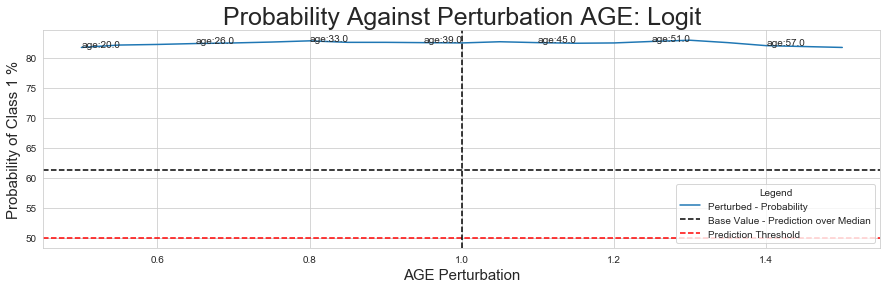

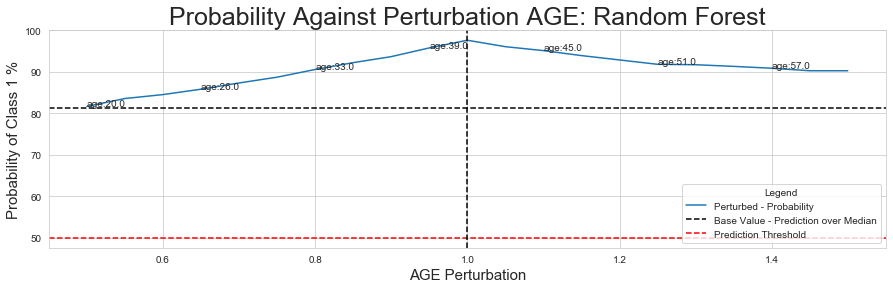

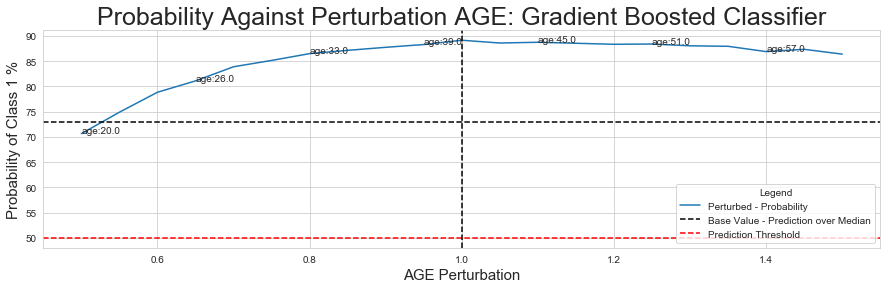

In [14]:
#Showing Samples
perturb_graph(model = logit,mode = 'accuracy', data = X_test_holdout, column = 'age', title = 'Logit')
perturb_graph(model = rfc,mode = 'accuracy', data = X_test_holdout, column = 'age', title = 'Random Forest')
perturb_graph(model = gbc,mode = 'accuracy', data = X_test_holdout, column ='age', title = 'Gradient Boosted Classifier')

perturb_graph(model = logit,mode = 'proportion', data = X_test_holdout, column = 'age', title = 'Logit')
perturb_graph(model = rfc,mode = 'proportion', data = X_test_holdout, column = 'age', title = 'Random Forest')
perturb_graph(model = gbc,mode = 'proportion', data = X_test_holdout, column ='age', title = 'Gradient Boosted Classifier')

In [15]:
def perturb_graph_cons(data, mode, column, title = 'Label with Model Type: GBC/RFC/etc..'):
    '''
    Parameters:
        data: df object
        column: pass dataframe column, e.g, age, fnlwgt etc. Can pass a list of columns, e.g., ['age', 'fnlwgt']
        title: str; pass title of graph 
    
    Returns:
        Perturbed Input Graph. Shows all models simultaneously, as opposed to the above
    
    '''
    clone = data.copy()
    column = column


    a = [str(i) + '%' for i in range(0, 201) if i % 5 == 0]
    b = [(i / 100) for i in range(0, 201) if i % 5 == 0]
    pertu = dict(zip(a, b))
    pert = [i for i in pertu.values()]

    rfc_preds = []
    gbc_preds = []
    logit_preds = []
    
    rfc_1_preds =[]
    gbc_1_preds =[]
    logit_1_preds =[]
    
    for i in pert:
        clone[column] = data[column] * (i)
        #rfc_preds.append(
        #    rfc.predict_proba(clone.median().values.reshape(
        #        (1, clone.shape[1])))[:, 1][0] * 100)
        #gbc_preds.append(
        #    gbc.predict_proba(clone.median().values.reshape(
        #        (1, clone.shape[1])))[:, 1][0] * 100)
        #logit_preds.append(
        #    logit.predict_proba(clone.median().values.reshape(
        #        (1, clone.shape[1])))[:, 1][0] * 100)
        rfc_preds.append(sklearn.metrics.accuracy_score(y_test_holdout, rfc.predict(clone))*100)
        gbc_preds.append(sklearn.metrics.accuracy_score(y_test_holdout, gbc.predict(clone))*100)
        logit_preds.append(sklearn.metrics.accuracy_score(y_test_holdout, logit.predict(clone))*100)
        rfc_1_preds.append((collections.Counter(rfc.predict(clone))[1] / y_test_holdout.shape[0]) *100)
        gbc_1_preds.append((collections.Counter(gbc.predict(clone))[1] / y_test_holdout.shape[0]) *100)
        logit_1_preds.append((collections.Counter(logit.predict(clone))[1] / y_test_holdout.shape[0]) *100)
        
    fig, ax1 = plt.subplots(1, 1, figsize=(17, 4))
    if 'accuracy' in mode:
        sns.lineplot(x=pert, y=rfc_preds, ax=ax1)
        sns.lineplot(x=pert, y=gbc_preds, ax=ax1)
        sns.lineplot(x=pert, y=logit_preds, ax=ax1)
        ax1.set_ylabel('Accuracy %', fontsize=15)
        ax1.set_title('Accuracy {}: {}'.format(
        column.upper(), title),
                  fontsize=25)
        
    elif 'proportion' in mode:
        sns.lineplot(x=pert, y=rfc_1_preds, ax=ax1)
        sns.lineplot(x=pert, y=gbc_1_preds, ax=ax1)
        sns.lineplot(x=pert, y=logit_1_preds, ax=ax1)
        ax1.set_ylabel('% of Predictions == 1', fontsize=15)
        ax1.set_title('Proportionality of Predictions {}: {}'.format(
        column.upper(), title),
                  fontsize=25)
        
    #ax1.axhline(base_value, ls='--',color = 'r')
    #ax1.text(.5,.72, "Base Value - Prediction over mean ", fontsize=13)
    ax1.set_xlabel('{} Perturbation'.format(column), fontsize=15)
    plt.legend(title='Model',
               loc='upper left',
               labels=[
                   'Random Forest', 'Gradient Boosted Classifier',
                   'Logistic Regression'
               ])

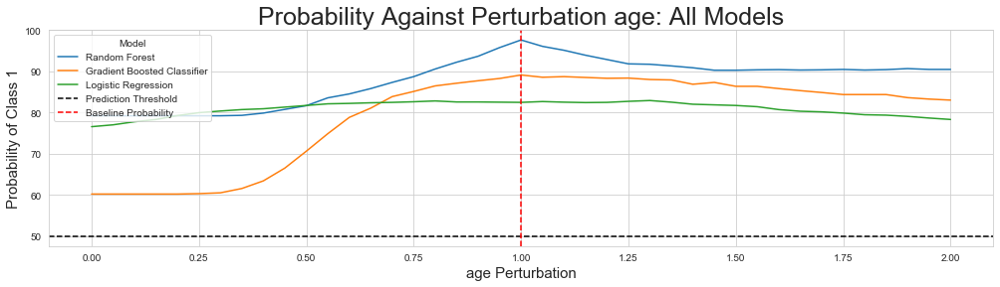

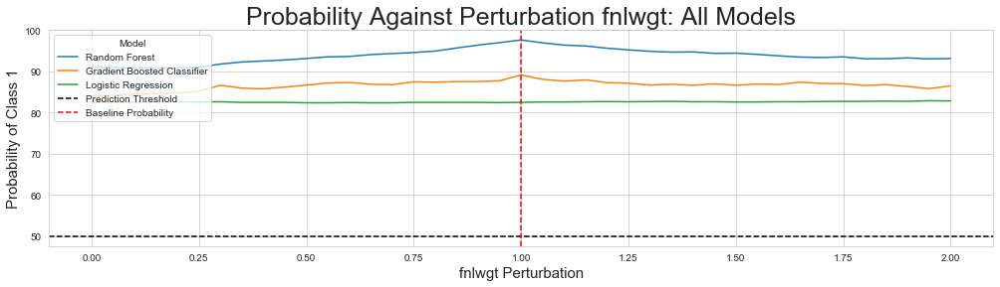

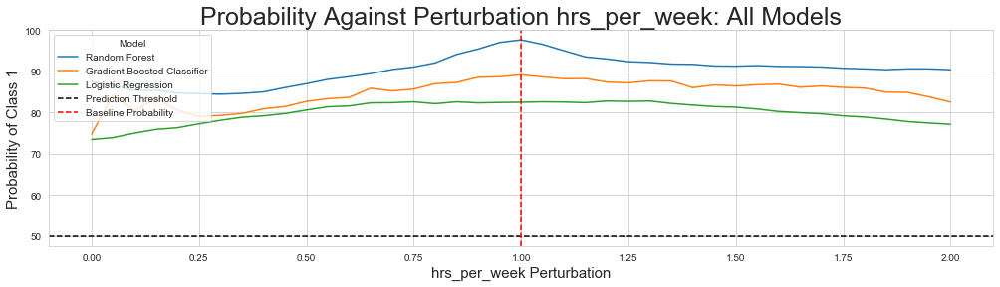

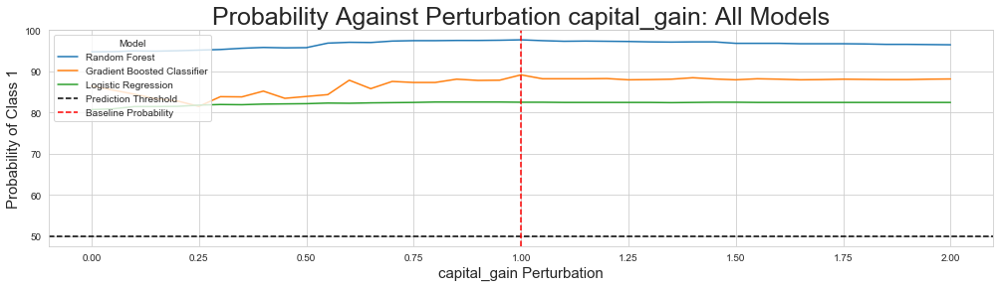

In [17]:
perturb_graph_cons(data = X_test_holdout, mode = 'accuracy', column = 'age', title = 'All Models')
perturb_graph_cons(data = X_test_holdout, mode = 'accuracy', column = 'fnlwgt', title = 'All Models')
perturb_graph_cons(data = X_test_holdout, mode = 'accuracy', column = 'hrs_per_week', title = 'All Models')

perturb_graph_cons(data = X_test_holdout, mode = 'proportion', column = 'age', title = 'All Models')
perturb_graph_cons(data = X_test_holdout, mode = 'proportion', column = 'fnlwgt', title = 'All Models')
perturb_graph_cons(data = X_test_holdout, mode = 'proportion', column = 'hrs_per_week', title = 'All Models')


Lime (Local) Explanations

In [16]:
import keras
import lime
import lime.lime_tabular


#Keras and Sklearn have different ways of showing prediction probabilities. Keras == model.predict, sklearn == model.predict_proba
def explain_lime(model, train, test, observation, seed = 1, num_features = 10):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        test: object; test set dataframe
        observation: int (index of explanation on test data set)
        seed: int; default to 1
        num_features: int, the number of features to be displayed in explanation
        
    Returns:
        Local explanations over test set - Summary
    '''

    if type(model) == keras.engine.sequential.Sequential:
        predict_fn = lambda x: model.predict(encoder.transform(x).toarray())
    else:
        predict_fn = lambda x: model.predict_proba(encoder.transform(x)).astype(float)

    explainer = lime.lime_tabular.LimeTabularExplainer(
        train,
        feature_names=feature_names,
        class_names=class_names,
        categorical_features=categorical_features,
        categorical_names=categorical_names,
        kernel_width=3)

    np.random.seed(seed)
    i = observation
    
    exp = explainer.explain_instance(test[i], predict_fn, num_features= num_features)
    exp.show_in_notebook(show_all=True)

    print('-' * 125)    
    print("Looking at Observation: {}".format(i))
    print("Actual Class Label: {}".format(y_test[i]))   
    %matplotlib inline
    try: #If Keras
        print("Predicted Class Label: {}".format(np.argmax(model.predict(encoder.transform(test).toarray()),axis = 1)[i]))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict(encoder.transform(test).toarray())[i]*100)))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction......")
    except: #If Sklearn
        print('-' * 125)
        print("Predicted Class Label: {}".format(np.argmax(model.predict_proba(encoder.transform(test[i].reshape(1,-1))).astype(float))
        ))
        print("Prediction Confidence (Prob): {0:.2f}%".format(np.max(model.predict_proba(encoder.transform(test[i].reshape(1,-1)))[0])*100))
        print('-' * 125)
        print("Displaying Local Explanation for Prediction: Top {} Features......".format(num_features))
    fig = exp.as_pyplot_figure()

-----------------------------------------------------------------------------------------------------------------------------
Looking at Observation: 1
Actual Class Label: 1
Predicted Class Label: 1
Prediction Confidence (Prob): 79.99%
-----------------------------------------------------------------------------------------------------------------------------
Displaying Local Explanation for Prediction......


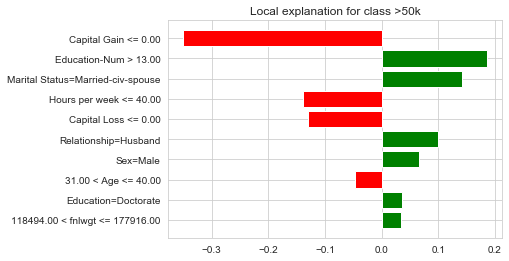

In [17]:
explain_lime(model = keras_ann, train = X_train, test = X_test, observation=1)

Shap (Local & Global Explanations)

In [35]:
import shap
import warnings
warnings.filterwarnings('ignore')
shap.initjs()

X_train_shap = pd.DataFrame(encoded_train.toarray(), columns=features)
X_test_shap = pd.DataFrame(encoder.transform(X_test).toarray(),
                           columns=features)
X_shap = pd.concat([X_train_shap, X_test_shap])


shap_values = load_obj('data_objects/shap_values')  #Load Dict of Shap Values
models = {
    str(type(rfc)): ('Random Forest', shap_values[str(type(rfc))]),
    str(type(gbc)): ('Gradient Boosted Classifier', shap_values[str(type(gbc))]),
    str(type(logit)): ('Logistic Regression', shap_values[str(type(logit))]),
    str(type(sk_ann)): ('Sklearn MultiLayer Perceptron', shap_values[str(type(sk_ann))]),
    str(type(keras_ann)): ('Keras Multilayer Perceptron', shap_values[str(type(keras_ann))])
}

In [40]:
def shap_local_graph(model, train, observation):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        observation: int

    Returns:
        Local Shap Explanation
    
    '''
    #Keras doesn't have a model.predict_proba function. It outputs the probabilities via predict method
    if type(model) ==keras.engine.sequential.Sequential:
        f = lambda x: model.predict(x)[:, 1]
    else:
        f = lambda x: model.predict_proba(x)[:, 1]
    #We use the median as a proxy for computational efficiency. Rather than getting the expected value over the whole
    #training distribution, we get E(f(x)) over the median of the training set, e.g., model.predict(median(xi))
    med = train.median().values.reshape((1, train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    print("{} Shap Values".format(models[str(type(model))][0]))

    return shap.force_plot(
        explainer.
        expected_value,  #Expected value is the base value - E(mean(f(x)))
        models[str(type(model))][1][observation],
        feature_names=features)


#plot_cmap=['#808080', '#0000FF']

In [41]:
#Testing
shap_local_graph(model=keras_ann, train = X_train_shap, observation=1)
#shap_local_graph(model=logit, train = X_train_shap, observation=3000, model_str='logit')
#shap_local_graph(model=rfc, train = X_train_shap, observation=3000, model_str='rfc')
#shap_local_graph(model=gbc, train = X_train_shap, observation=3000, model_str='gbc')

Keras Multilayer Perceptron Shap Values


In [42]:
def shap_many_graph(model, train, test):
    '''
    Parameters:
    model: object,
        Random Forest: rfc
        Gradient Boosted Classifier: gbc
        Logistic Regression: logit
        Keras Neural Network = keras_ann
        Sklearn Neural Network = sk_ann
    train: object; train set dataframe
    test: object; test set dataframe

        
    Returns:
    Global Shap Explanations over test set
    
    '''
    #Keras doesn't have a model.predict_proba function. It outputs the probabilities via predict method
    if type(model) == keras.engine.sequential.Sequential:
        f = lambda x: model.predict(x)[:, 1]
    else:
        f = lambda x: model.predict_proba(x)[:, 1]
    med = train.median().values.reshape((1, train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    return shap.force_plot(explainer.expected_value, models[str(type(model))][1],
                           test)

In [51]:
#Testing
shap_many_graph(keras_ann, train = X_train_shap, test = X_test_shap)

In [ ]:
shap.dependence_plot("age", shap_values['keras_ann'], X_test_shap)

In [49]:
def shap_summary_graph(model, train, test):
    '''
    Parameters:
        model: object,
            Random Forest: rfc
            Gradient Boosted Classifier: gbc
            Logistic Regression: logit
            Keras Neural Network = keras_ann
            Sklearn Neural Network = sk_ann
        train: object; train set dataframe
        test: object; test set dataframe

        
    Returns:
    Global Shap Explanations over test set - Summary
    '''
    if type(model) == keras.engine.sequential.Sequential:
        f = lambda x: model.predict(x)[:, 1]
    else:
        f = lambda x: model.predict_proba(x)[:, 1]
    med = train.median().values.reshape((1, train.shape[1]))
    explainer = shap.KernelExplainer(f, med)
    print("{} Shap Values".format(models[str(type(model))][0]))
    return shap.summary_plot(models[str(type(model))][1],
                             test,
                             class_names=class_names,
                             plot_type="dot")

Keras Multilayer Perceptron Shap Values


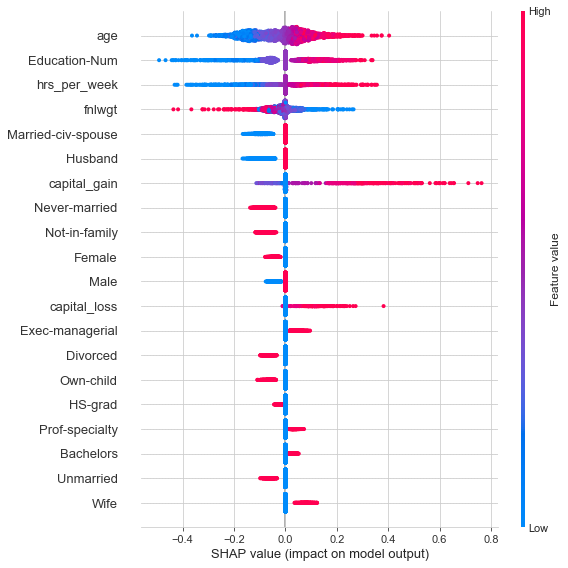

Logistic Regression Shap Values


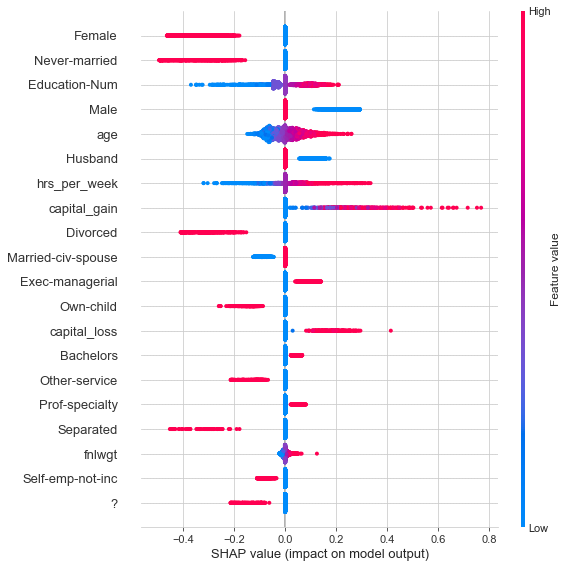

Random Forest Shap Values


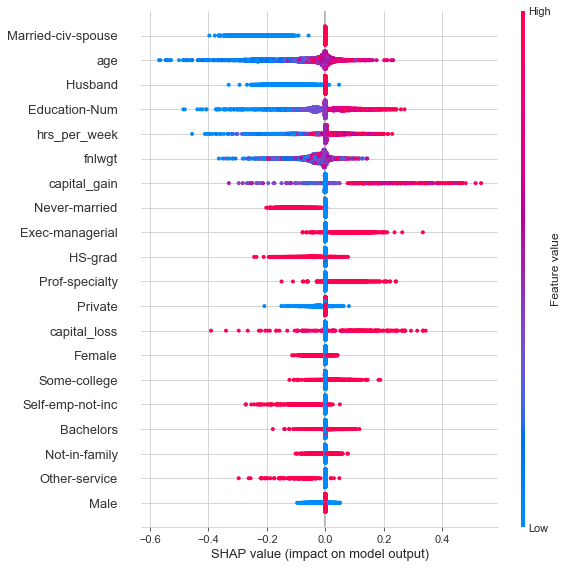

Gradient Boosted Classifier Shap Values


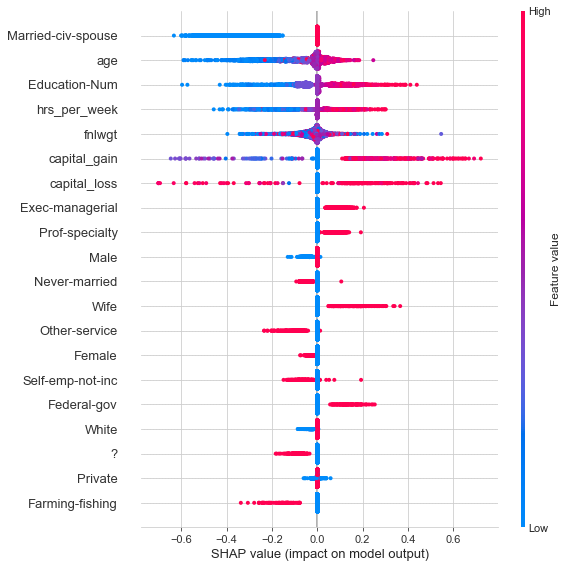

In [50]:
#Testing
shap_summary_graph(keras_ann, train = X_train_shap, test = X_test_shap)
#shap_summary_graph(sk_ann, data = X_train_shap, model_str='sklearn_ann')
shap_summary_graph(logit, train = X_train_shap, test = X_test_shap)
shap_summary_graph(rfc, train = X_train_shap, test = X_test_shap)
shap_summary_graph(gbc, train = X_train_shap, test = X_test_shap)

In [37]:

rfc_shapvalues = pd.DataFrame(shap_values[str(type(rfc))], columns = features).sum()
logit_shapvalues = pd.DataFrame(shap_values[str(type(logit))], columns = features).sum()
gbc_shapvalues = pd.DataFrame(shap_values[str(type(gbc))], columns = features).sum()
keras_ann_shapvalues = pd.DataFrame(shap_values[str(type(keras_ann))], columns = features).sum()

logit_shapvalues.to_csv('obj/lendingclub/shap/logit_shap.csv')
rfc_shapvalues.to_csv('obj/lendingclub/shap/rfc_shap.csv')
gbc_shapvalues.to_csv('obj/lendingclub/shap/gbc_shap.csv')
keras_ann_shapvalues.to_csv('obj/lendingclub/shap/ann_shap.csv')



rfc_shapvalues_abs = pd.DataFrame(shap_values[str(type(rfc))], columns = features).abs().sum()
logit_shapvalues_abs = pd.DataFrame(shap_values[str(type(logit))], columns = features).abs().sum()
gbc_shapvalues_abs = pd.DataFrame(shap_values[str(type(gbc))], columns = features).abs().sum()
keras_ann_shapvalues_abs = pd.DataFrame(shap_values[str(type(keras_ann))], columns = features).abs().sum()


logit_shapvalues_abs.to_csv('obj/lendingclub/shap/logit_shap_abs.csv')
rfc_shapvalues_abs.to_csv('obj/lendingclub/shap/rfc_shap_abs.csv')
gbc_shapvalues_abs.to_csv('obj/lendingclub/shap/gbc_shap_abs.csv')
keras_ann_shapvalues_abs.to_csv('obj/lendingclub/shap/ann_shap_abs.csv')



Working with Integrated Gradients

In [16]:
#ig = integrated_gradients(keras_ann)
#from collections import OrderedDict

#from IntegratedGradients import IntegratedGradients

#ig = IntegratedGradients.integrated_gradients(keras_ann)

#def fetch_grads(test_data):
#    grads = []
#    for i in test_data.toarray():
#        grads.append(ig.explain(i, num_steps= 1000))
#    return pd.DataFrame(grads, columns = features)

    
#keras_ig_df = fetch_grads(encoded_test) 

#save_obj(keras_ig_df, 'keras_ig_df')


Evaluated output channel (0-based index): All
Building gradient functions
Progress: 100.0%
Done.


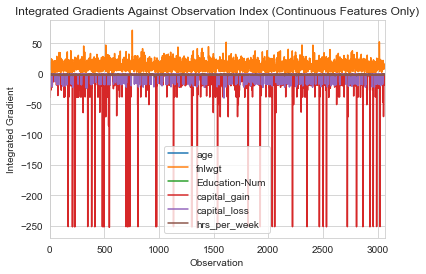

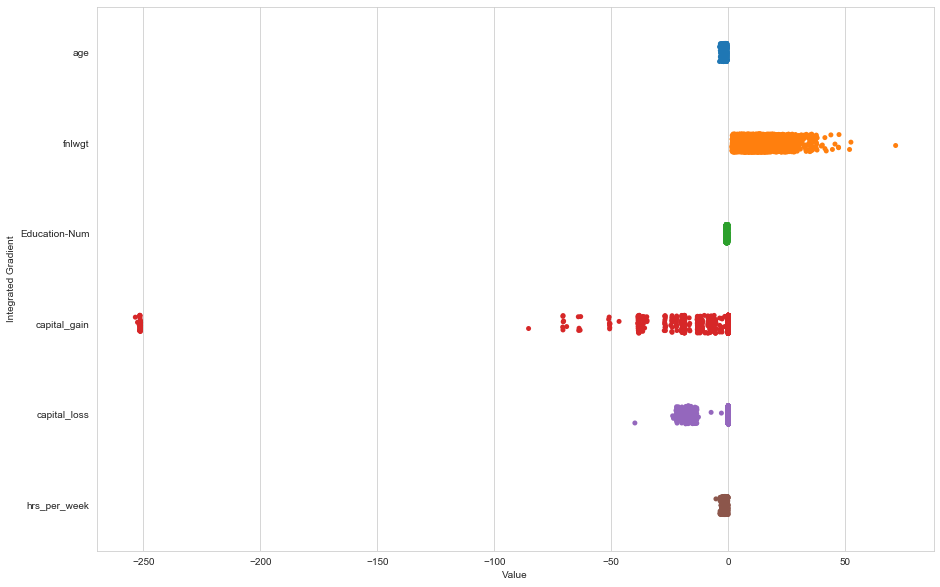

In [20]:
#Show integrated gradients of only continuous features
keras_ig_df = load_obj('data_objects/keras_ig_df')
keras_ig_df[continuous].plot()
rcParams['figure.figsize'] = 15,10  #Adjust plot size
plt.title('Integrated Gradients Against Observation Index (Continuous Features Only)')
plt.ylabel('Integrated Gradient')
plt.xlabel('Observation')
plt.show()


df_sns = keras_ig_df[continuous].melt(var_name='groups', value_name='vals')
sns.stripplot(x="vals", y="groups", data=df_sns)
plt.ylabel('Integrated Gradient')
plt.xlabel('Value')
plt.show()

DeepExplain - Shapley/Saliency maps/Gradient * Input

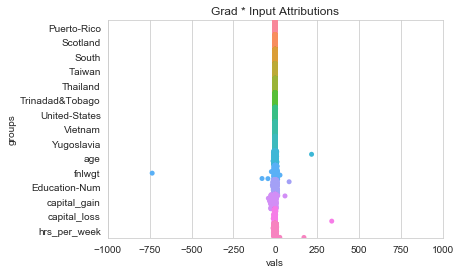

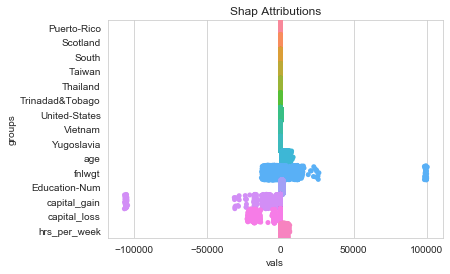

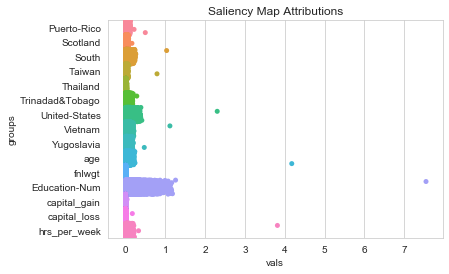

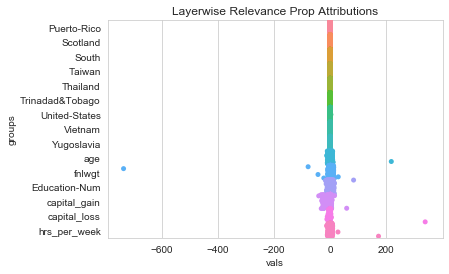

In [16]:
#Attributions computed over training set
attributions_gradin = load_obj('attributions_gradin')
attributions_sal = load_obj('attributions_sal')
attributions_elrp = load_obj('attributions_elrp')
attributions_sv = load_obj('attributions_sv')

deep_df = pd.DataFrame(attributions_gradin, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter = .5)
plt.xlim(-1000, 1000)
plt.title('Grad * Input Attributions')
plt.show()

deep_df = pd.DataFrame(attributions_sv, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter = .5)
plt.title('Shap Attributions')
plt.show()

deep_df = pd.DataFrame(attributions_sal, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter = .5)
plt.title('Saliency Map Attributions')
plt.show()

deep_df = pd.DataFrame(attributions_elrp, columns=features)
deep_df = deep_df.iloc[:, -15:].melt(var_name='groups', value_name='vals')
ax = sns.stripplot(x="vals", y="groups", data=deep_df, jitter = .5)
plt.title('Layerwise Relevance Prop Attributions')
plt.show()

GAM

In [ ]:
def shap_to_csv(model, file_name):
    local = pd.DataFrame(shap_values[str(type(model))],
                             columns=features) #Sampling 1st 500 observations for speed
    local.to_csv('obj/census/gam/{}_local.csv'.format(file_name))
    
shap_to_csv(gbc, 'gbc')
shap_to_csv(logit, 'logit')
shap_to_csv(keras_ann, 'keras_ann')
shap_to_csv(rfc, 'rfc')

'''
local shap values for all models are stored in the obj folder
change attributions_path based on which model you want to evaluate
    obj/rfc_local.csv
    obj/keras_ann_local.csv
    obj/gbc_local.csv
    obj/logit_local.csv

'''

from gam.gam.gam import GAM


gam = GAM(attributions_path="obj/census/gam/keras_ann_local.csv", k=2)


gam.generate()


Max Iterations:  1000


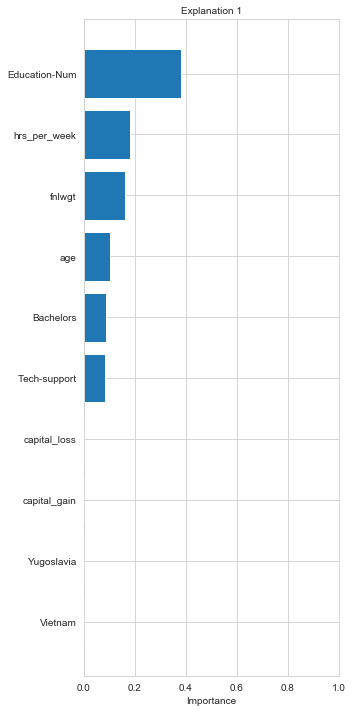

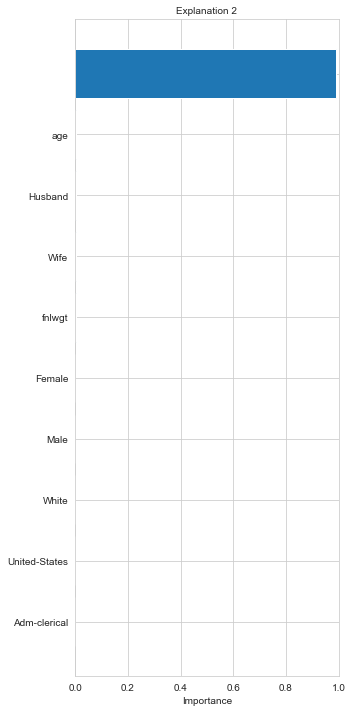

[('', 0.0), ('?', 0.0), ('Federal-gov', 0.0), ('Local-gov', 0.0), ('Never-worked', 0.0), ('Private', 0.0), ('Self-emp-inc', 0.0), ('Self-emp-not-inc', 0.0), ('State-gov', 0.0), ('Without-pay', 0.0), ('10th', 0.0), ('11th', 0.0), ('12th', 0.0), ('1st-4th', 0.0), ('5th-6th', 0.0), ('7th-8th', 0.0), ('9th', 0.0), ('Assoc-acdm', 0.0), ('Assoc-voc', 0.0), ('Bachelors', 0.08783001037963539), ('Doctorate', 0.0), ('HS-grad', 0.0), ('Masters', 0.0), ('Preschool', 0.0), ('Prof-school', 0.0), ('Some-college', 0.0), ('Divorced', 0.0), ('Married-AF-spouse', 0.0), ('Married-civ-spouse', 0.0), ('Married-spouse-absent', 0.0), ('Never-married', 0.0), ('Separated', 0.0), ('Widowed', 0.0), ('?', 0.0), ('Adm-clerical', 0.0), ('Armed-Forces', 0.0), ('Craft-repair', 0.0), ('Exec-managerial', 0.0), ('Farming-fishing', 0.0), ('Handlers-cleaners', 0.0), ('Machine-op-inspct', 0.0), ('Other-service', 0.0), ('Priv-house-serv', 0.0), ('Prof-specialty', 0.0), ('Protective-serv', 0.0), ('Sales', 0.0), ('Tech-support

In [22]:
gam.plot(num_features= 10)
print(gam.explanations[0])
#a = gam.explanations[0]
#sorted_by_second = sorted(a, key=lambda tup: tup[1], reverse=True)
#sorted_by_second